# Preprocessing and clustering scATAC PBMCs

The data consist in ~3000 cells of human PBMCs. Cells were FAC sorted thus providing a ground truth for cell type identification. The data was produces by [Buenrostro et al. 2018](https://pubmed.ncbi.nlm.nih.gov/29706549/)
The original count matrix (using bulk peaks as features) from Buenrostro et al. is available here: [GSE96772](https://www.ncbi.nlm.nih.gov/geo/query/acc.cgi?acc=GSE96772)

On a unix system, you can uncomment and run the following to download the count matri in its anndata format. 

In [1]:
# !mkdir data
# !wget https://www.dropbox.com/s/cwlaaxl70t27tb2/data_tutorial_buenrostro.tar.gz?dl=0 -O data/data_tutorial_buenrostro.tar.gz
# !cd data; tar -xzf data_tutorial_buenrostro.tar.gz
# !mkdir write

If episcanpy isn't installed already. Or if some of the functions aren't working. Install the following version:

In [2]:
# !pip install git+https://github.com/colomemaria/epiScanpy

## Load libraries

In [3]:
import scanpy as sc
import anndata as ad
import numpy as np
import pandas as pd
import episcanpy.api as epi

/Users/annadanese/opt/anaconda3/lib/python3.7/site-packages/scanpy/api/__init__.py:7: FutureWarning: 

In a future version of Scanpy, `scanpy.api` will be removed.
Simply use `import scanpy as sc` and `import scanpy.external as sce` instead.

  FutureWarning,


In [4]:
sc.settings.set_figure_params(dpi=80, color_map='gist_earth')

In [5]:
results_file = 'write/buenrostro_pbmc.h5ad'  # the file that will store the analysis results

## Load the data

Read in the count matrix into an [AnnData](https://anndata.readthedocs.io/en/latest/anndata.AnnData.html) object, which holds many slots for annotations and different representations of the data. It also comes with its own HDF5 file format: .h5ad.



In [6]:
adata = ad.read('data/data_tutorial_buenrostro/all_buenrostro_bulk_peaks.h5ad')
adata

AnnData object with n_obs × n_vars = 2034 × 491436
    obs: 'batch', 'cell_name'

In [7]:
# display information stored in adata.obs
adata.obs

,batch,cell_name
BM1077-MPP-Frozen-160105-1.dedup.st.bam,0,BM1077-MPP-Frozen-160105-1
singles-20160726-scATAC-BM1137-GMP3high-HYC-88.dedup.st.bam,0,singles-20160726-scATAC-BM1137-GMP3high-HYC-88
singles-160808-scATAC-BM1137-GMP2mid-LS-65.dedup.st.bam,0,singles-160808-scATAC-BM1137-GMP2mid-LS-65
singles-BM0828-LMPP-frozen-151105-20.dedup.st.bam,0,singles-BM0828-LMPP-frozen-151105-20
singles-160819-BM1137-CMP-LS-95.dedup.st.bam,0,singles-160819-BM1137-CMP-LS-95
...,...,...
BM1077-LMPP-Frozen-160107-40.dedup.st.bam,1,BM1077-LMPP-Frozen-160107-40
BM1077-MPP-Frozen-160105-74.dedup.st.bam,1,BM1077-MPP-Frozen-160105-74
singles-BM1214-GMP-160421-9.dedup.st.bam,1,singles-BM1214-GMP-160421-9
singles-BM0828-LMPP-frozen-151105-62.dedup.st.bam,1,singles-BM0828-LMPP-frozen-151105-62


In [8]:
# checking the variable names (bulk peaks coordinates)
print(adata.var_names)

Index(['chr1_10279_10779', 'chr1_13252_13752', 'chr1_16019_16519',
       'chr1_29026_29526', 'chr1_96364_96864', 'chr1_115440_115940',
       'chr1_237535_238035', 'chr1_240811_241311', 'chr1_540469_540969',
       'chr1_713909_714409',
       ...
       'chrX_154822578_154823078', 'chrX_154840821_154841321',
       'chrX_154841449_154841949', 'chrX_154841956_154842456',
       'chrX_154842517_154843017', 'chrX_154862057_154862557',
       'chrX_154870909_154871409', 'chrX_154880741_154881241',
       'chrX_154891824_154892324', 'chrX_154896342_154896842'],
      dtype='object', name='index', length=491436)


### Extract the FACs information from the file names

In [9]:
adata.obs['facs_label'] = ['MEP' if 'MEP' in line else line.split('.bam')[0].lstrip('singles-').split('BM')[-1].split('-')[1] for line in adata.obs['cell_name'].tolist()]
adata

AnnData object with n_obs × n_vars = 2034 × 491436
    obs: 'batch', 'cell_name', 'facs_label'

### Load the additional metadata

In [10]:
!head 'data/data_tutorial_buenrostro/metadata.tsv'

label	cell_type
BM1077-CLP-Frozen-160106-13	CLP
BM1077-CLP-Frozen-160106-14	CLP
BM1077-CLP-Frozen-160106-2	CLP
BM1077-CLP-Frozen-160106-21	CLP
BM1077-CLP-Frozen-160106-27	CLP
BM1077-CLP-Frozen-160106-3	CLP
BM1077-CLP-Frozen-160106-36	CLP
BM1077-CLP-Frozen-160106-42	CLP
BM1077-CLP-Frozen-160106-44	CLP


In [11]:
# format the cell names to match the metadata file
adata.obs_names = [x.split('/')[-1].split('.dedup.st.bam')[0] for x in adata.obs_names.tolist()]
adata.obs_names

Index(['BM1077-MPP-Frozen-160105-1',
       'singles-20160726-scATAC-BM1137-GMP3high-HYC-88',
       'singles-160808-scATAC-BM1137-GMP2mid-LS-65',
       'singles-BM0828-LMPP-frozen-151105-20',
       'singles-160819-BM1137-CMP-LS-95', 'BM1077-MPP-Frozen-160105-36',
       'singles-20160726-scATAC-BM1214-CMP-LS-84',
       'BM1077-CMP-Frozen-160106-21', 'singles-BM0106-HSC-SIM-160219-36',
       'singles-BM1214-GMP-160421-60',
       ...
       'singles-160822-BM1137-CMP-LS-91',
       'singles-BM0828-CMP-frozen-151118-69',
       'singles-20160617-scATAC-BM1214-CMP-LS-40',
       'singles-BM0828-GMP-151027-2',
       'singles-20160726-scATAC-BM1214-CMP-LS-19',
       'BM1077-LMPP-Frozen-160107-40', 'BM1077-MPP-Frozen-160105-74',
       'singles-BM1214-GMP-160421-9', 'singles-BM0828-LMPP-frozen-151105-62',
       'singles-BM0828-MEP-160420-43'],
      dtype='object', length=2034)

In [12]:
epi.pp.load_metadata(adata,
                     'data/data_tutorial_buenrostro/metadata.tsv',
                     separator='\t')
adata

AnnData object with n_obs × n_vars = 2034 × 491436
    obs: 'batch', 'cell_name', 'facs_label', 'label', 'cell_type\n'

In [13]:
adata.obs['cell_type'] = [x.rstrip('\n') for x in adata.obs['cell_type\n']]
del adata.obs['cell_type\n'] 

In [14]:
adata

AnnData object with n_obs × n_vars = 2034 × 491436
    obs: 'batch', 'cell_name', 'facs_label', 'label', 'cell_type'

In [15]:
# check the 2 different annotation obtained
pd.crosstab(adata.obs['cell_type'], adata.obs['facs_label'])

facs_label,CLP,CMP,GMP,GMP1low,GMP2mid,GMP3high,HSC,LMPP,MCP,MEP,MPP,UNK,mono,pDC
cell_type,,,,,,,,,,,,,,
CLP,78,0,0,0,0,0,0,0,0,0,0,0,0,0
CMP,0,502,0,0,0,0,0,0,0,0,0,0,0,0
GMP,0,0,216,68,44,74,0,0,0,0,0,0,0,0
HSC,0,0,0,0,0,0,347,0,0,0,0,0,0,0
LMPP,0,0,0,0,0,0,0,160,0,0,0,0,0,0
MEP,0,0,0,0,0,0,0,0,0,138,0,0,0,0
MPP,0,0,0,0,0,0,0,0,0,0,142,0,0,0
UNK,0,0,0,0,0,0,0,0,0,0,0,60,0,0
mono,0,0,0,0,0,0,0,0,0,0,0,0,64,0


# Load gene/transcript annotation

Download annotation file (the data are aligned on hg19)

In [16]:
# !wget ftp://ftp.ebi.ac.uk/pub/databases/gencode/Gencode_human/release_19/gencode.v19.annotation.gtf.gz -O data/data_tutorial_buenrostro/gencode.v19.annotation.gtf.gz
# !cd data/data_tutorial_buenrostro; gunzip gencode.v19.annotation.gtf

In [17]:
epi.tl.find_genes(adata,
           gtf_file='data/data_tutorial_buenrostro/gencode.v19.annotation.gtf',
           key_added='transcript_annotation',
           upstream=2000,
           feature_type='transcript',
           annotation='HAVANA',
           raw=False)

In [18]:
adata

AnnData object with n_obs × n_vars = 2034 × 491436
    obs: 'batch', 'cell_name', 'facs_label', 'label', 'cell_type'
    var: 'transcript_annotation'

# Preprocessing

#### Check if the data matrix is binary - if not, binarize the data matrix

In [19]:
print(np.max(adata.X))

1.0


In [20]:
# Here, the data is already binary. If not, run the following commands
# epi.pp.binarize(adata)
# print(np.max(adata.X))

Proceed to basic filtering.

In [21]:
adata

AnnData object with n_obs × n_vars = 2034 × 491436
    obs: 'batch', 'cell_name', 'facs_label', 'label', 'cell_type'
    var: 'transcript_annotation'

In [22]:
# remove any potential empty features or barcodes
epi.pp.filter_cells(adata, min_features=1)
epi.pp.filter_features(adata, min_cells=1)

In [23]:
# filtered out 24210 peaks
adata

AnnData object with n_obs × n_vars = 2034 × 467226
    obs: 'batch', 'cell_name', 'facs_label', 'label', 'cell_type', 'nb_features'
    var: 'transcript_annotation', 'n_cells'

### Quality controls

In [24]:
adata.obs['log_nb_features'] = [np.log10(x) for x in adata.obs['nb_features']]
adata

AnnData object with n_obs × n_vars = 2034 × 467226
    obs: 'batch', 'cell_name', 'facs_label', 'label', 'cell_type', 'nb_features', 'log_nb_features'
    var: 'transcript_annotation', 'n_cells'

... storing 'facs_label' as categorical
... storing 'cell_type' as categorical
... storing 'transcript_annotation' as categorical


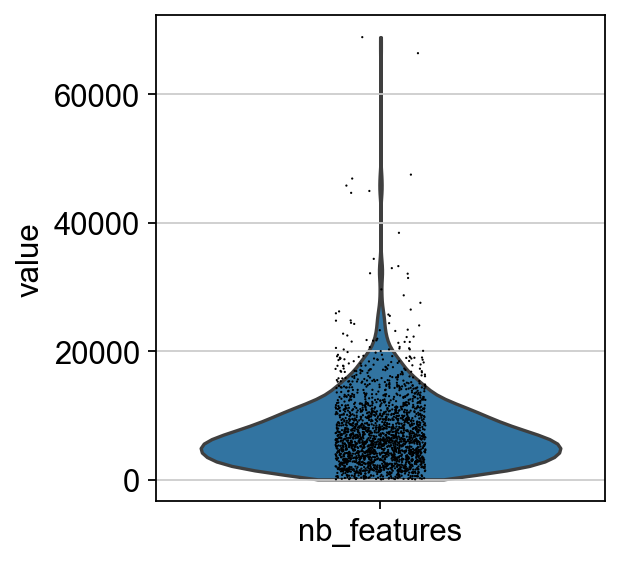

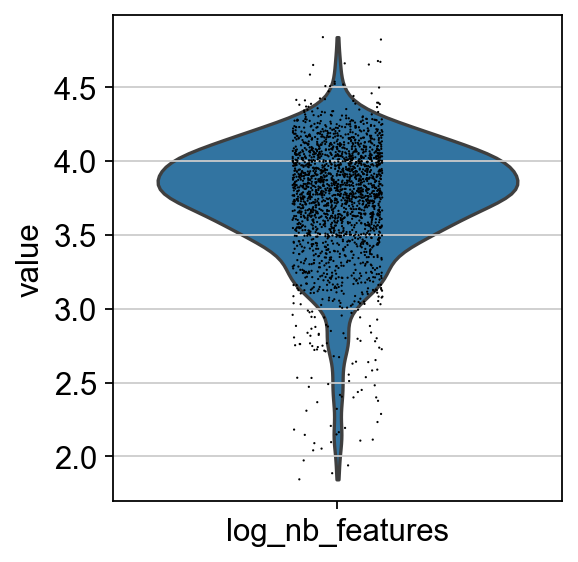

In [25]:
epi.pl.violin(adata, ['nb_features'])
epi.pl.violin(adata, ['log_nb_features'])

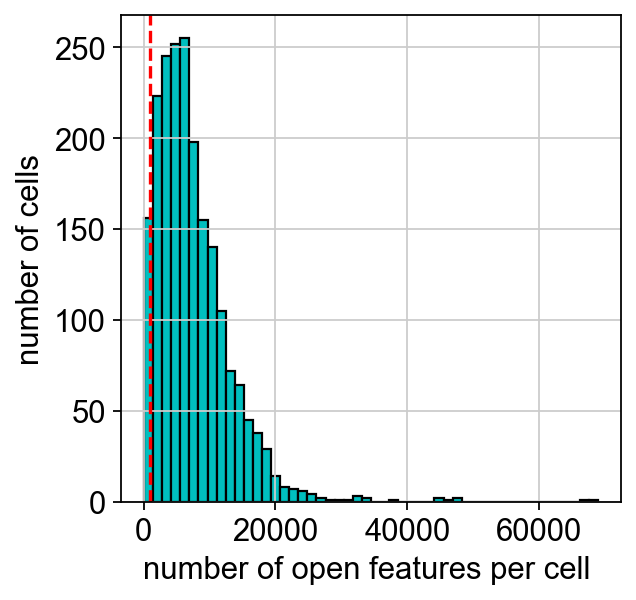

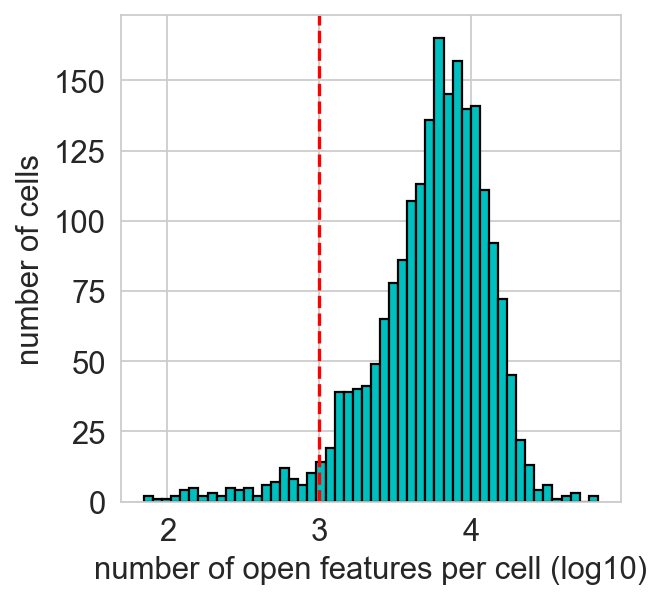

In [26]:
# set a minimum number of cells to keep 
min_features = 1000

epi.pp.coverage_cells(adata, binary=True, log=False, bins=50,
               threshold=min_features, save='Buenrostro_bulk_peaks_coverage_cells.png')
epi.pp.coverage_cells(adata, binary=True, log=10, bins=50,
               threshold=min_features, save='Buenrostro_bulk_peaks_coverage_cells_log10.png')

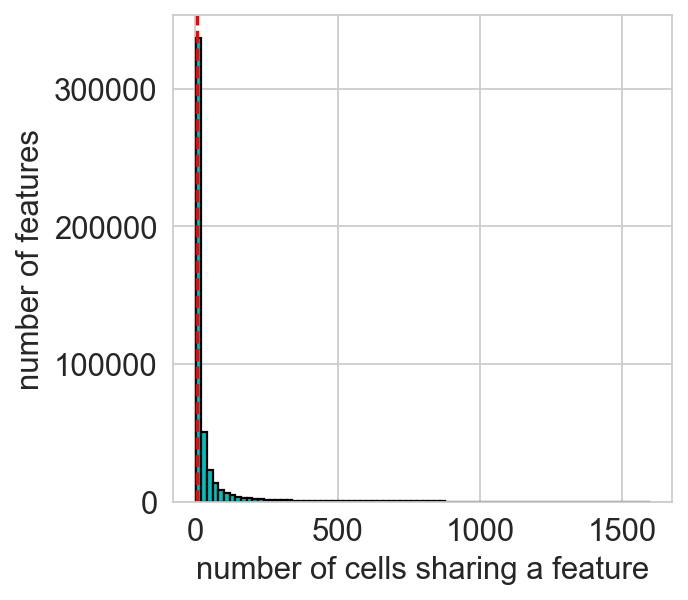

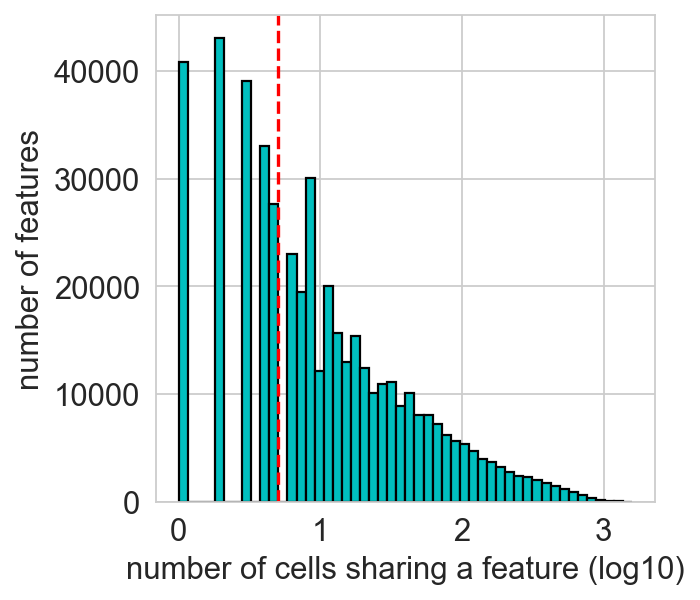

In [27]:
# minimum number of cells sharing a feature
min_cells = 5
epi.pp.coverage_features(adata, binary=True, log=False, 
                        threshold=min_cells, save='Buenrostro_bulk_peaks_coverage_peaks.png')
epi.pp.coverage_features(adata, binary=True, log=True, 
                        threshold=min_cells, save='Buenrostro_bulk_peaks_coverage_peaks_log10.png')

### Actually proceed to filter the cells and peaks based on the QC plots

In [28]:
min_features = 1000
epi.pp.filter_cells(adata, min_features=min_features)
adata

AnnData object with n_obs × n_vars = 1945 × 467226
    obs: 'batch', 'cell_name', 'facs_label', 'label', 'cell_type', 'nb_features', 'log_nb_features'
    var: 'transcript_annotation', 'n_cells', 'commonness'

In [29]:
min_cells = 5
epi.pp.filter_features(adata, min_cells=min_cells)
adata

AnnData object with n_obs × n_vars = 1945 × 311035
    obs: 'batch', 'cell_name', 'facs_label', 'label', 'cell_type', 'nb_features', 'log_nb_features'
    var: 'transcript_annotation', 'n_cells', 'commonness'

### Looking at the QC plots after filtering

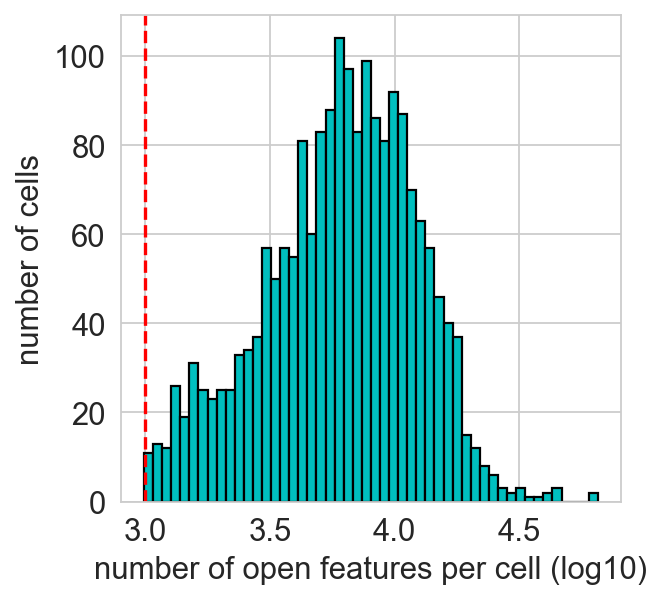

In [30]:
epi.pp.coverage_cells(adata, binary=True, log='log10', bins=50, threshold=min_features)

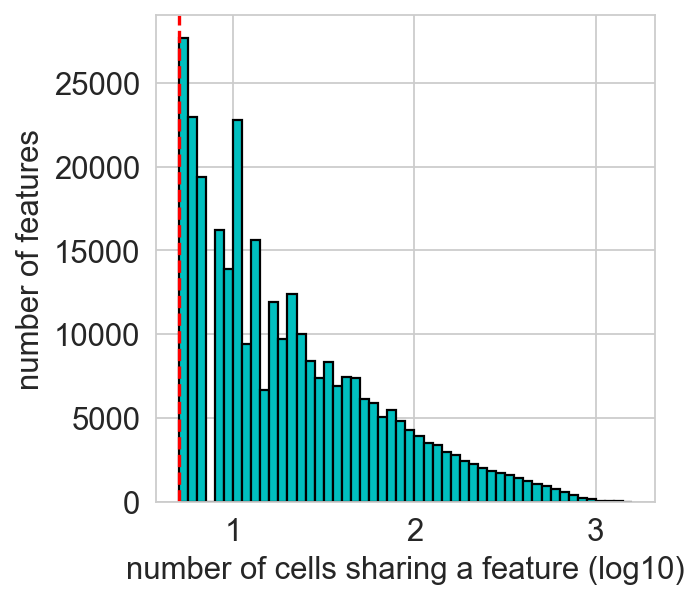

In [31]:
epi.pp.coverage_features(adata, binary=True, log='log10', bins=50, threshold=min_cells)

### Identifying the most variable features

We aim to select a cuttof after the elbow.

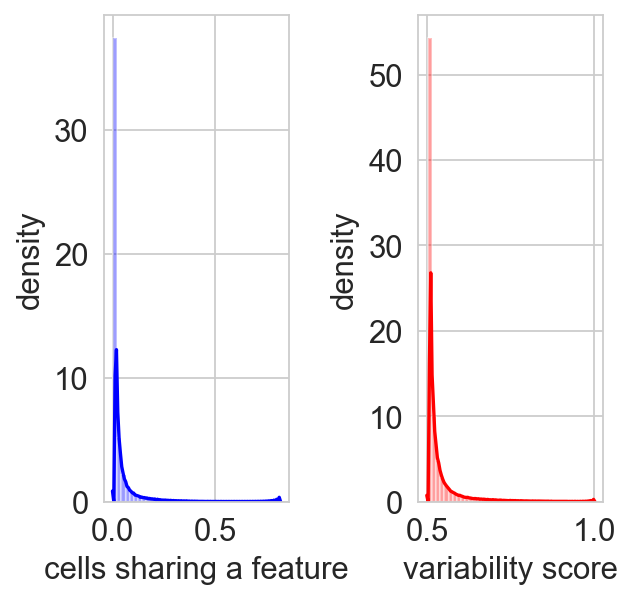

In [32]:
epi.pp.cal_var(adata)

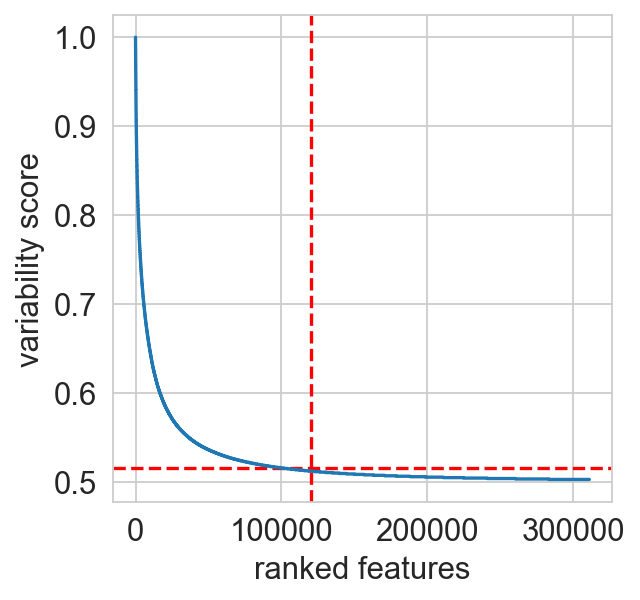

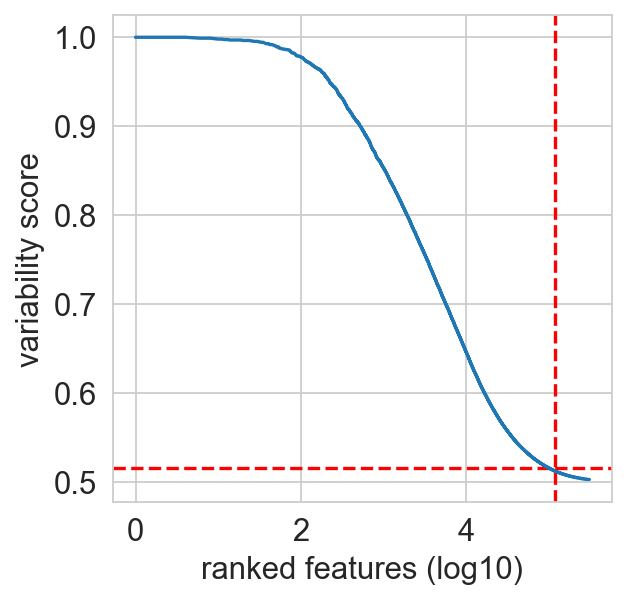

In [33]:
min_score_value = 0.515
nb_feature_selected = 120000
epi.pl.variability_features(adata,log=None,
                     min_score=min_score_value, nb_features=nb_feature_selected,
                     save='variability_features_plot_bonemarrow_peakmatrix.png')

epi.pl.variability_features(adata,log='log10',
                     min_score=min_score_value, nb_features=nb_feature_selected,
                     save='variability_features_plot_bonemarrow_peakmatrix_log10.png')

In [34]:
# save the current matrix in the raw layer
adata.raw = adata

In [35]:
# create a new AnnData containing only the most variable features
adata = epi.pp.select_var_feature(adata,
                                  nb_features=nb_feature_selected,
                                  show=False,
                                  copy=True)

In [36]:
adata

View of AnnData object with n_obs × n_vars = 1945 × 122511
    obs: 'batch', 'cell_name', 'facs_label', 'label', 'cell_type', 'nb_features', 'log_nb_features'
    var: 'transcript_annotation', 'n_cells', 'commonness', 'prop_shared_cells', 'variability_score'

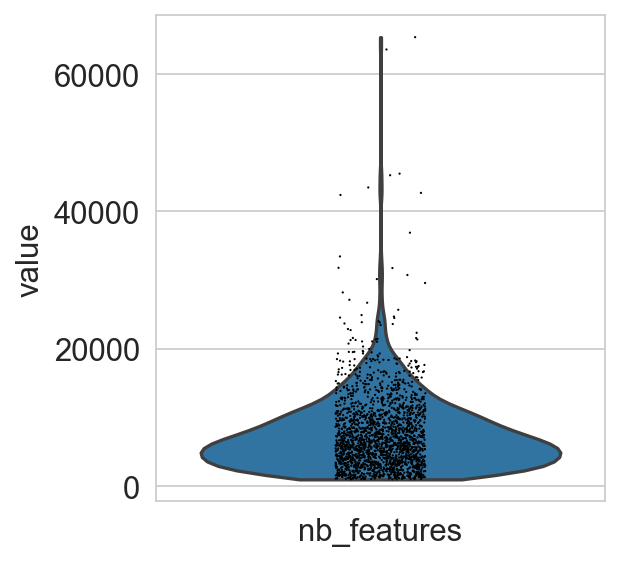

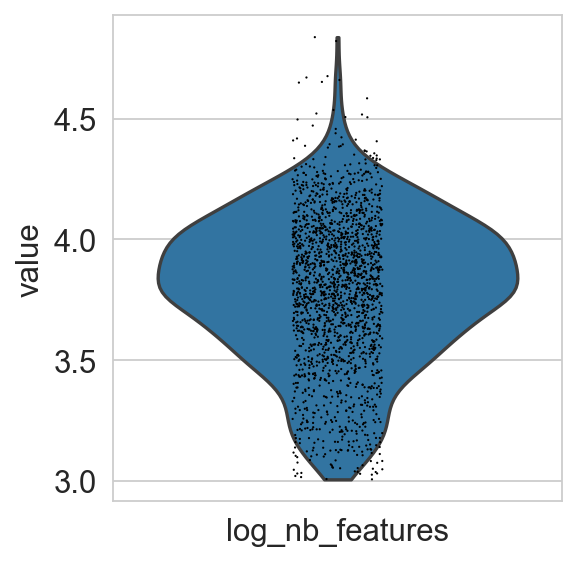

In [37]:
epi.pl.violin(adata, ['nb_features'])
epi.pl.violin(adata, ['log_nb_features'])

In [38]:
adata

View of AnnData object with n_obs × n_vars = 1945 × 122511
    obs: 'batch', 'cell_name', 'facs_label', 'label', 'cell_type', 'nb_features', 'log_nb_features'
    var: 'transcript_annotation', 'n_cells', 'commonness', 'prop_shared_cells', 'variability_score'

In [39]:
epi.pp.filter_cells(adata, min_features=2000)
epi.pp.filter_cells(adata, max_features=25000)

Trying to set attribute `.obs` of view, copying.


In [40]:
adata

AnnData object with n_obs × n_vars = 1722 × 122511
    obs: 'batch', 'cell_name', 'facs_label', 'label', 'cell_type', 'nb_features', 'log_nb_features'
    var: 'transcript_annotation', 'n_cells', 'commonness', 'prop_shared_cells', 'variability_score'

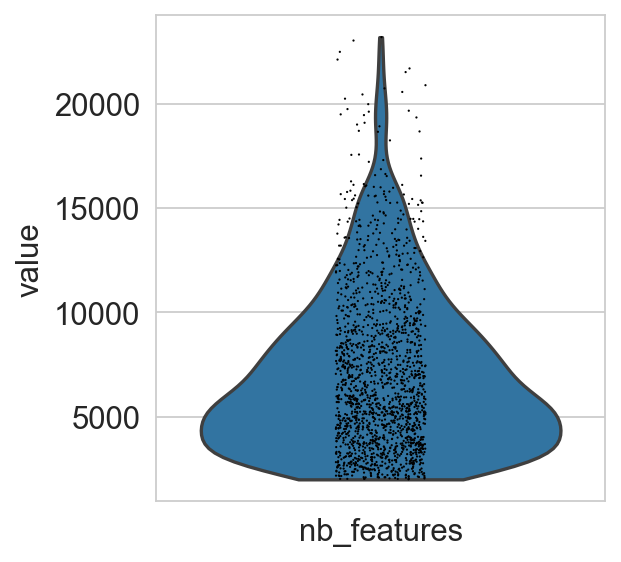

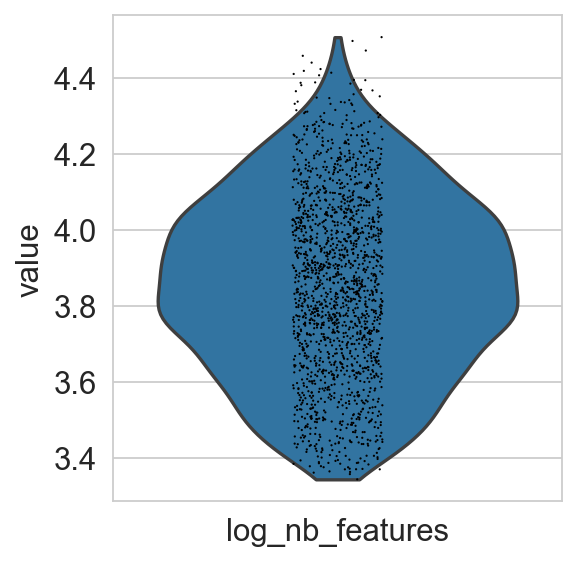

In [41]:
epi.pl.violin(adata, ['nb_features'])
epi.pl.violin(adata, ['log_nb_features'])

# Normalisation

#### Quick visualisation before normalisation

The lazy function compute PCA, neighbor graph umap and tsne embeddings.

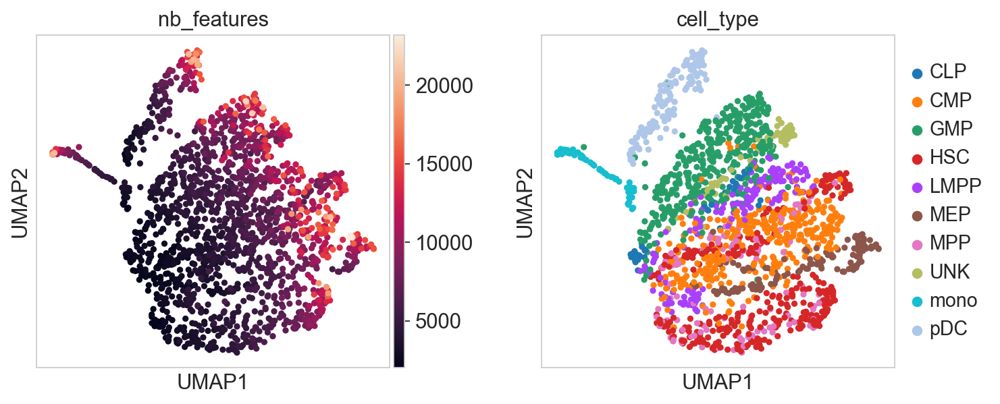

In [42]:
epi.pp.lazy(adata)
sc.pl.umap(adata, color=['nb_features', 'cell_type'], wspace=0.3)

In [43]:
# save the current version of the matrix (binary, not normalised) in a layer of the Anndata.
adata.layers['binary'] = adata.X.copy()

### Library size correction

In [44]:
epi.pp.normalize_total(adata)

In [45]:
# save the current version of the matrix (normalised) in a layer of the Anndata.
adata.layers['normalised'] = adata.X.copy()

In [46]:
adata

AnnData object with n_obs × n_vars = 1722 × 122511
    obs: 'batch', 'cell_name', 'facs_label', 'label', 'cell_type', 'nb_features', 'log_nb_features'
    var: 'transcript_annotation', 'n_cells', 'commonness', 'prop_shared_cells', 'variability_score'
    uns: 'pca', 'neighbors', 'umap', 'cell_type_colors'
    obsm: 'X_pca', 'X_tsne', 'X_umap'
    varm: 'PCs'
    layers: 'binary', 'normalised'
    obsp: 'distances', 'connectivities'

# Visualisation

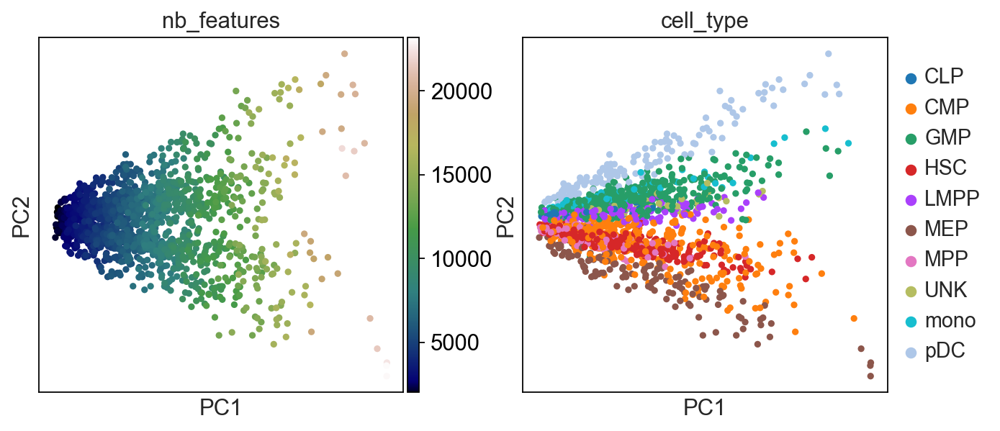

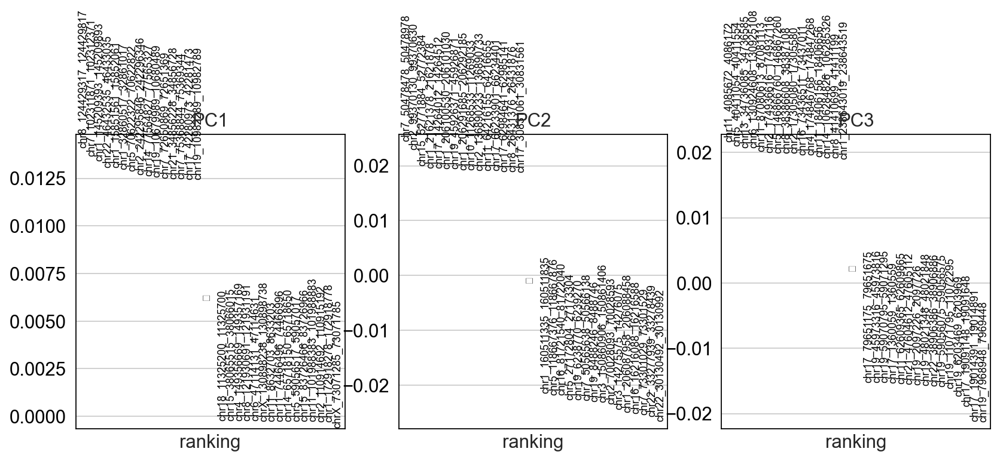

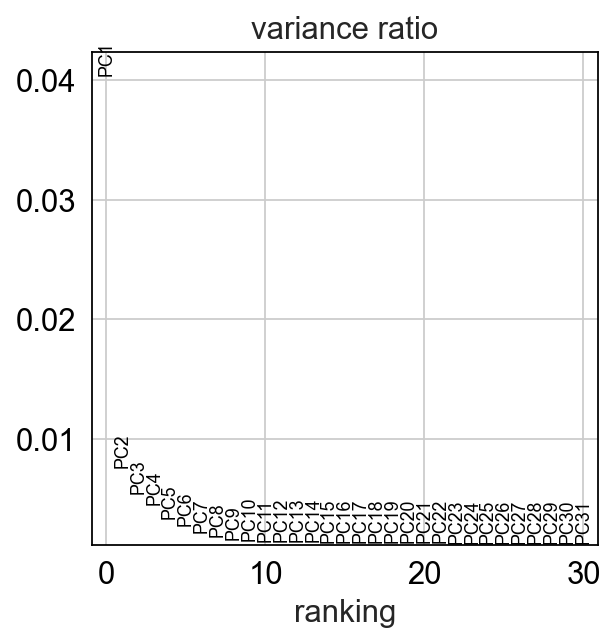

In [47]:
sc.settings.set_figure_params(dpi=80, color_map='gist_earth')
epi.pl.pca_overview(adata, color=['nb_features', 'cell_type'])

In [48]:
epi.pp.lazy(adata)

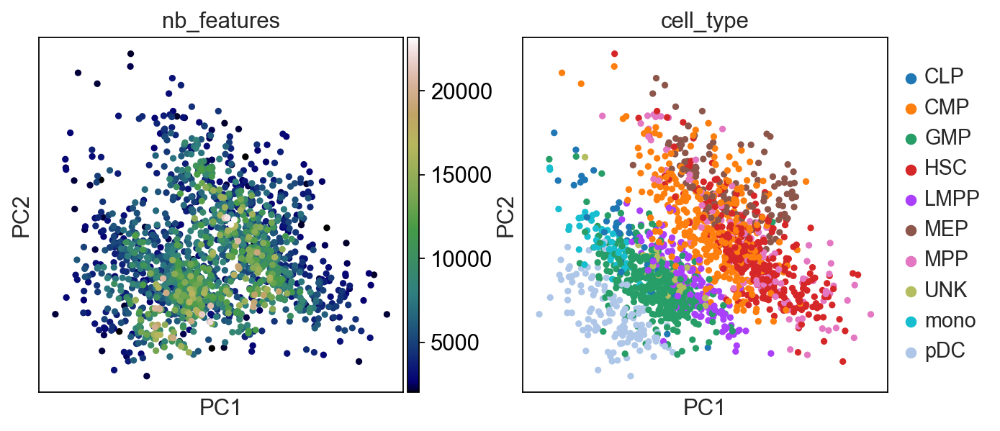

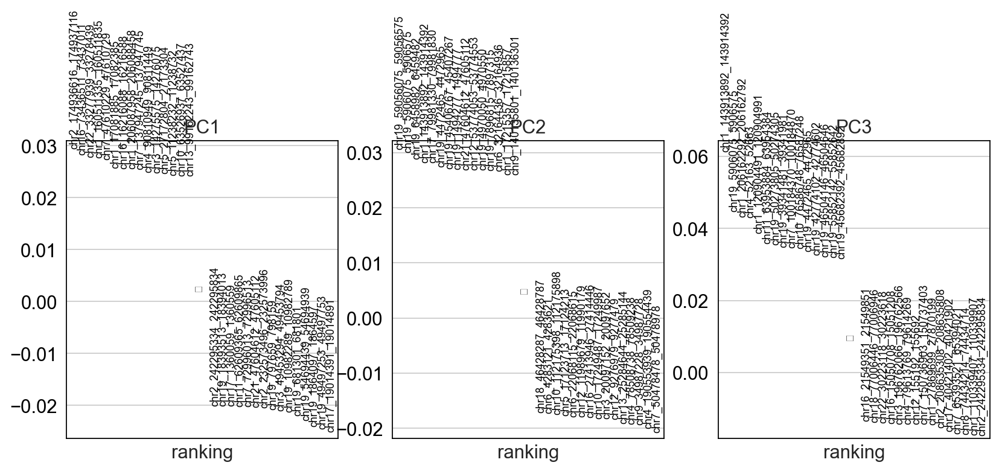

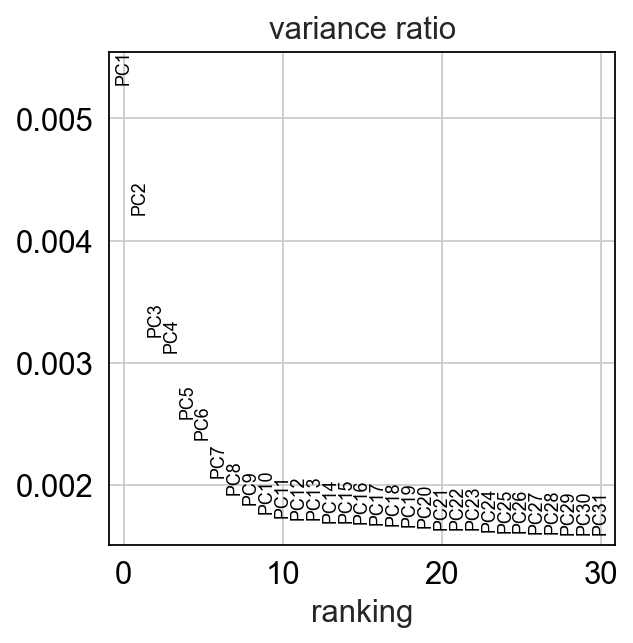

In [49]:
epi.pl.pca_overview(adata, color=['nb_features', 'cell_type'])

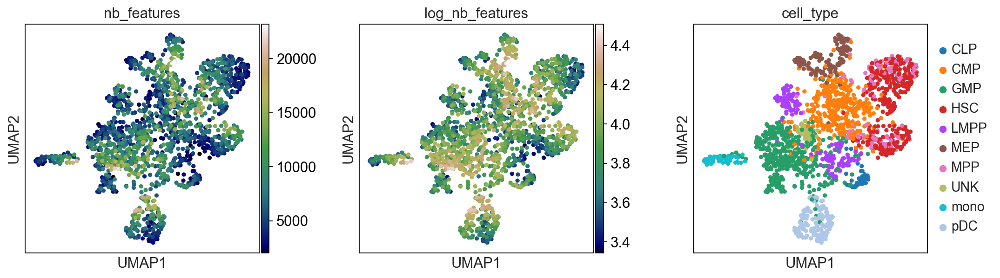

In [50]:
epi.pl.umap(adata, color=['nb_features', 'log_nb_features', 'cell_type'], wspace=0.3)

### Log transform. 
This isn't a mandatory step. It really depends of the dataset. Here, the number of features recovered per cell vary greatly. Thus, it benefits from a log transformation after normalisation.

In [51]:
epi.pp.log1p(adata)

In [52]:
epi.pp.lazy(adata)

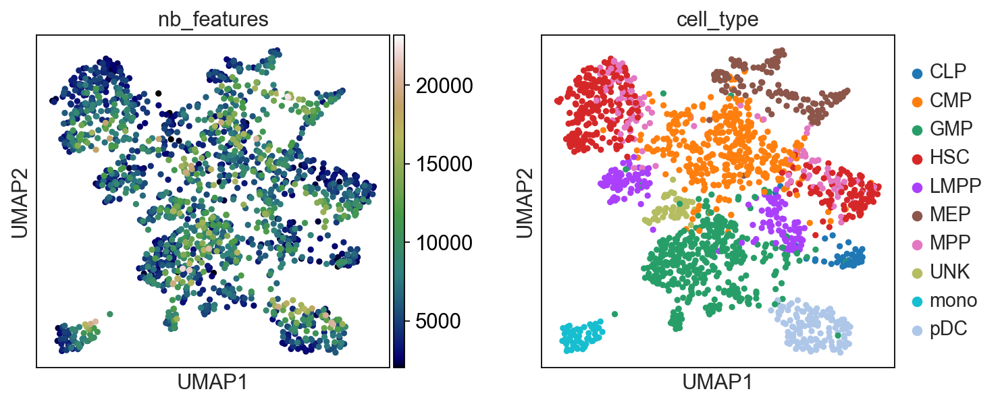

In [53]:
epi.pl.umap(adata, color=['nb_features', 'cell_type'], wspace=0.3)

# Cell clustering

### 1. Louvain clustering

In [54]:
adata

AnnData object with n_obs × n_vars = 1722 × 122511
    obs: 'batch', 'cell_name', 'facs_label', 'label', 'cell_type', 'nb_features', 'log_nb_features'
    var: 'transcript_annotation', 'n_cells', 'commonness', 'prop_shared_cells', 'variability_score'
    uns: 'pca', 'neighbors', 'umap', 'cell_type_colors', 'log1p'
    obsm: 'X_pca', 'X_tsne', 'X_umap'
    varm: 'PCs'
    layers: 'binary', 'normalised'
    obsp: 'distances', 'connectivities'

In [55]:
epi.tl.louvain(adata)

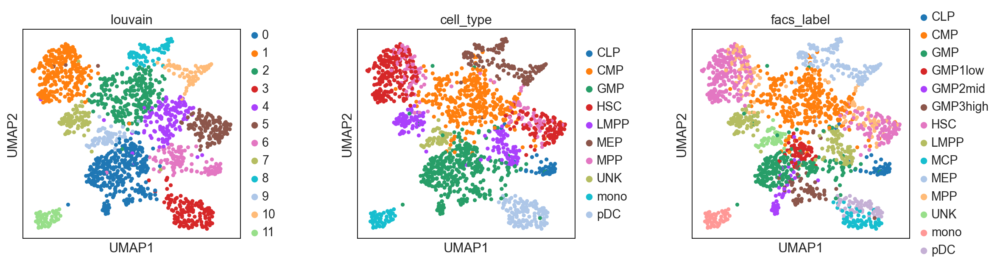

In [56]:
epi.pl.umap(adata, color=['louvain', 'cell_type', 'facs_label'], wspace=0.4)

In [57]:
epi.tl.getNClusters(adata, n_cluster=14)

step 0
got 17 at resolution 1.5
step 1
got 11 at resolution 0.75
step 2
got 12 at resolution 1.125
step 3
got 15 at resolution 1.3125
step 4
got 14 at resolution 1.21875


(1.21875,
 AnnData object with n_obs × n_vars = 1722 × 122511
     obs: 'batch', 'cell_name', 'facs_label', 'label', 'cell_type', 'nb_features', 'log_nb_features', 'louvain'
     var: 'transcript_annotation', 'n_cells', 'commonness', 'prop_shared_cells', 'variability_score'
     uns: 'pca', 'neighbors', 'umap', 'cell_type_colors', 'log1p', 'louvain', 'louvain_colors', 'facs_label_colors'
     obsm: 'X_pca', 'X_tsne', 'X_umap'
     varm: 'PCs'
     layers: 'binary', 'normalised'
     obsp: 'distances', 'connectivities')

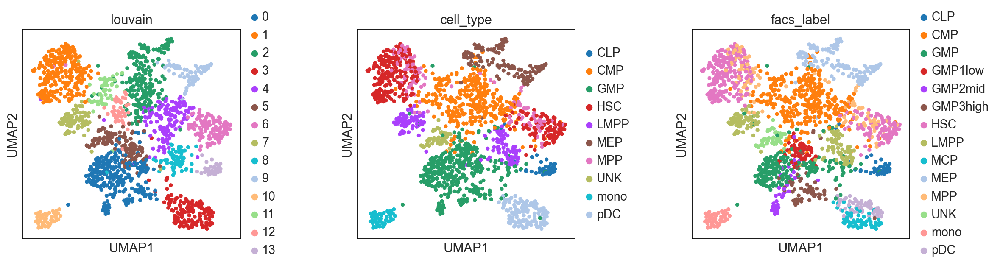

In [58]:
epi.pl.umap(adata, color=['louvain', 'cell_type', 'facs_label'], wspace=0.4)

### 2. kmeans clustering

In [59]:
epi.tl.kmeans(adata, num_clusters=14)

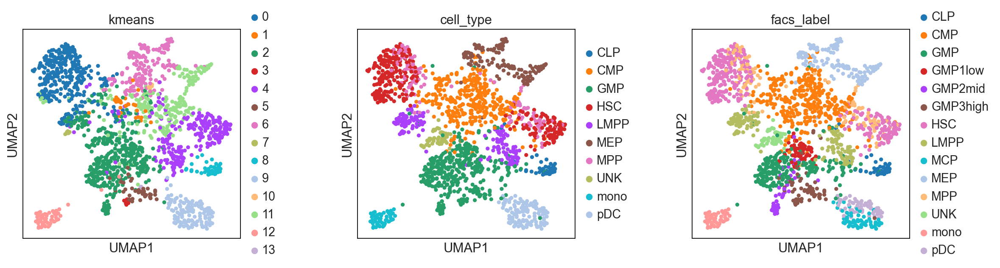

In [60]:
epi.pl.umap(adata, color=['kmeans', 'cell_type', 'facs_label'], wspace=0.4)

### 3. hierarchical clustering

In [61]:
epi.tl.hc(adata, num_clusters=14)

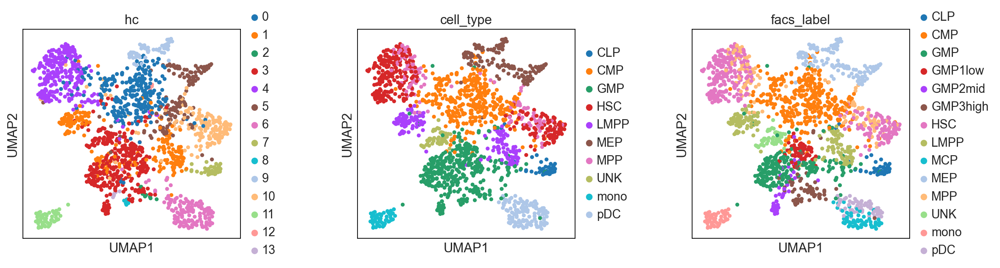

In [62]:
epi.pl.umap(adata, color=['hc', 'cell_type', 'facs_label'], wspace=0.4)

### 4. leiden clustering

In [63]:
epi.tl.leiden(adata)

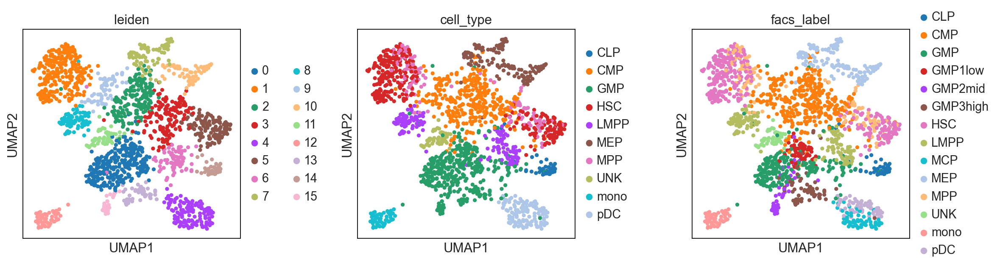

In [64]:
epi.pl.umap(adata, color=['leiden', 'cell_type', 'facs_label'], wspace=0.4)

In [65]:
epi.tl.getNClusters(adata, n_cluster=14, method='leiden')

step 0
got 20 at resolution 1.5
step 1
got 13 at resolution 0.75
step 2
got 16 at resolution 1.125
step 3
got 16 at resolution 0.9375
step 4
got 14 at resolution 0.84375


(0.84375,
 AnnData object with n_obs × n_vars = 1722 × 122511
     obs: 'batch', 'cell_name', 'facs_label', 'label', 'cell_type', 'nb_features', 'log_nb_features', 'louvain', 'kmeans', 'hc', 'leiden'
     var: 'transcript_annotation', 'n_cells', 'commonness', 'prop_shared_cells', 'variability_score'
     uns: 'pca', 'neighbors', 'umap', 'cell_type_colors', 'log1p', 'louvain', 'louvain_colors', 'facs_label_colors', 'kmeans_colors', 'hc_colors', 'leiden', 'leiden_colors'
     obsm: 'X_pca', 'X_tsne', 'X_umap'
     varm: 'PCs'
     layers: 'binary', 'normalised'
     obsp: 'distances', 'connectivities')

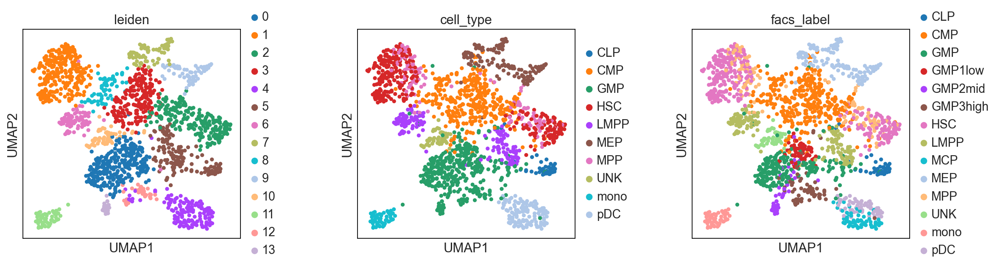

In [66]:
epi.pl.umap(adata, color=['leiden', 'cell_type', 'facs_label'], wspace=0.4)

### 5. Comparison and Adjusted Rand Index (ARI)

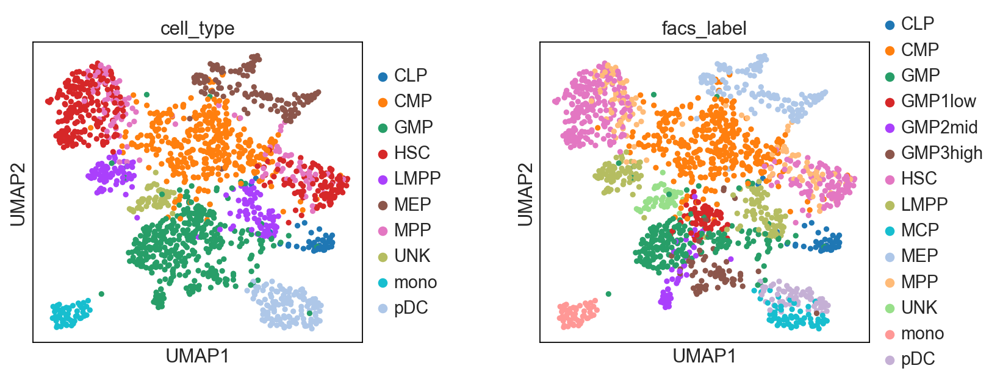

In [67]:
# True labels
epi.pl.umap(adata, color=['cell_type', 'facs_label'], wspace=0.4)

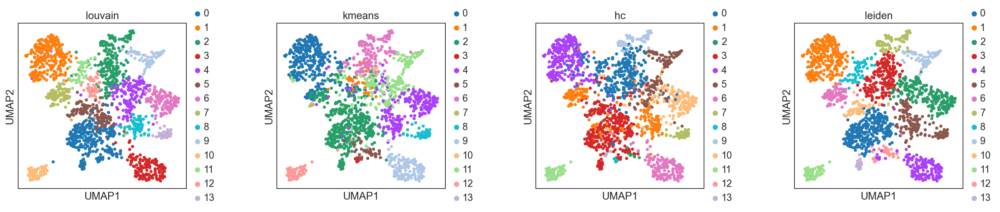

In [68]:
# Clusters
epi.pl.umap(adata, color=['louvain', 'kmeans', 'hc', 'leiden'], wspace=0.4)

#### A few metrics to compare the quality of the different clusterings. 
For all these methods. The best value possible is 1.

**1)** Compute the **Adjusted Rand Index** for the different clustering to determine which one perform best.
It computes a similarity measure between two clusterings (predicted and true labels)by counting cells that are assigned in the same or different clusters between the two clusterings.

In [69]:
print('louvain:\t', epi.tl.ARI(adata, 'louvain', 'cell_type'))
print('kmeans:\t', epi.tl.ARI(adata, 'kmeans', 'cell_type'))
print('hc:\t', epi.tl.ARI(adata, 'hc', 'cell_type'))
print('leiden:\t', epi.tl.ARI(adata, 'leiden', 'cell_type'))

louvain:	 0.48143459493055457
kmeans:	 0.34473337260007614
hc:	 0.4869084669795262
leiden:	 0.5215454468198376


**2)** Compute the **Homogeneity score**. The score is higher when the different clusters contain only cells with the same ground truth label

In [70]:
print('louvain:\t', epi.tl.homogeneity(adata, 'louvain', 'cell_type'))
print('kmeans:\t', epi.tl.homogeneity(adata, 'kmeans', 'cell_type'))
print('hc:\t', epi.tl.homogeneity(adata, 'hc', 'cell_type'))
print('leiden:\t', epi.tl.homogeneity(adata, 'leiden', 'cell_type'))

louvain:	 0.6027317462511458
kmeans:	 0.5218117148571952
hc:	 0.597155399046304
leiden:	 0.6462131688120222


**3)** Compute the **Adjusted Mutual Information**, it is measure of the similarity between two labels of the same data, while accounting for chance (the Mutual information is generally higher for two set of labels with a large number of clusters)

In [71]:
print('louvain:\t', epi.tl.AMI(adata, 'louvain', 'cell_type'))
print('kmeans:\t', epi.tl.AMI(adata, 'kmeans', 'cell_type'))
print('hc:\t', epi.tl.AMI(adata, 'hc', 'cell_type'))
print('leiden:\t', epi.tl.AMI(adata, 'leiden', 'cell_type'))

louvain:	 0.6489850295660261
kmeans:	 0.5151669485843612
hc:	 0.607839434804083
leiden:	 0.6905252709103069


### Save the processed Anndata

In [72]:
adata.write(results_file)

## Differential chromatin analysis

In [73]:
adata = ad.read(results_file)
adata

AnnData object with n_obs × n_vars = 1722 × 122511
    obs: 'batch', 'cell_name', 'facs_label', 'label', 'cell_type', 'nb_features', 'log_nb_features', 'louvain', 'kmeans', 'hc', 'leiden'
    var: 'transcript_annotation', 'n_cells', 'commonness', 'prop_shared_cells', 'variability_score'
    uns: 'cell_type_colors', 'facs_label_colors', 'hc_colors', 'kmeans_colors', 'leiden', 'leiden_colors', 'louvain', 'louvain_colors', 'neighbors', 'pca', 'umap'
    obsm: 'X_pca', 'X_tsne', 'X_umap'
    varm: 'PCs'
    layers: 'binary', 'normalised'
    obsp: 'connectivities', 'distances'

In [74]:
epi.tl.rank_features(adata, 'louvain', omic='ATAC')

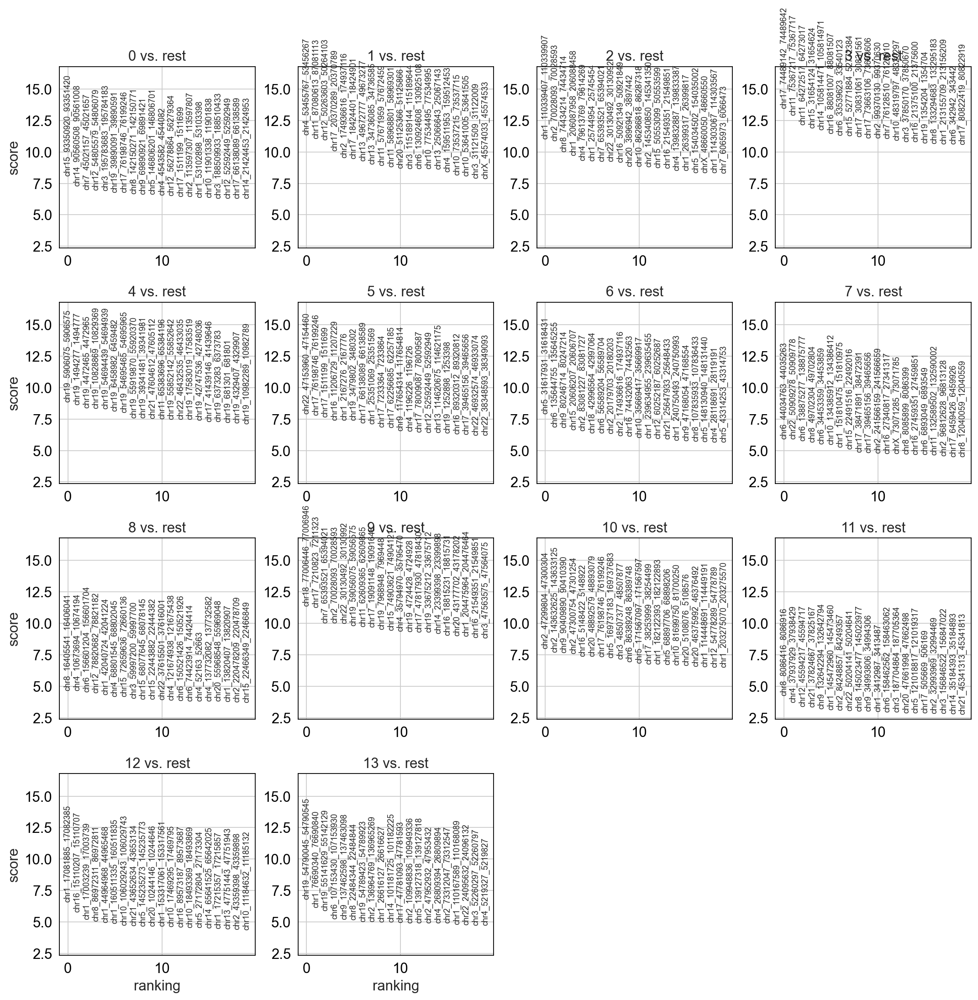

In [75]:
epi.pl.rank_feat_groups(adata)

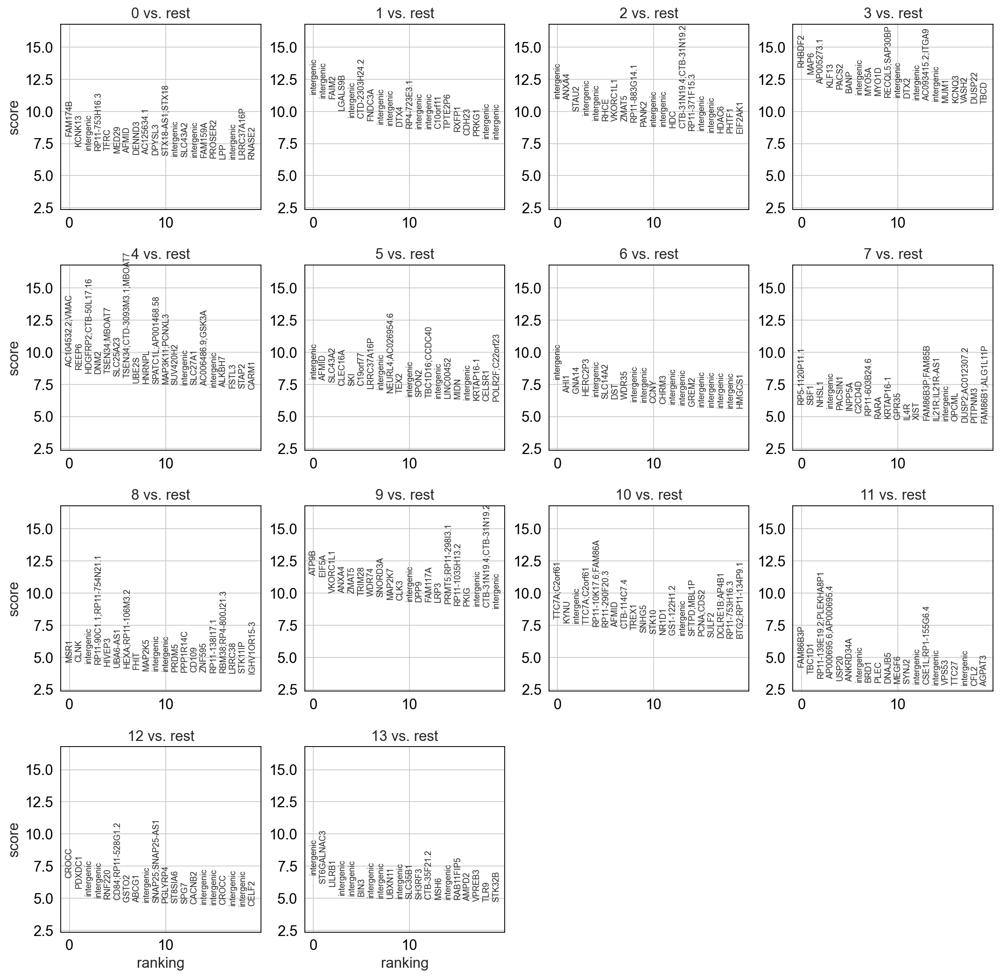

In [76]:
epi.pl.rank_feat_groups(adata, feature_symbols='transcript_annotation')

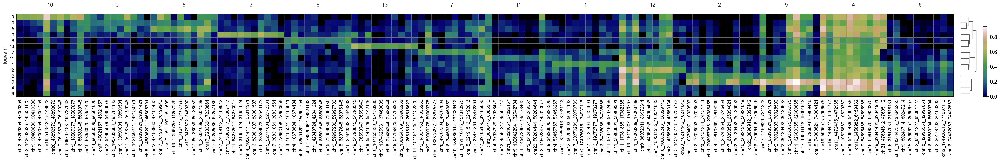

In [77]:
epi.pl.rank_feat_groups_matrixplot(adata)